In [1]:
from IPython.display import Audio
import matplotlib.pyplot as plt

from scipy.io import wavfile
from scipy import signal
from scipy.signal import resample
import numpy as np
import torch as th
import torchiva
from df import enhance, init_df
from speechbrain.processing.features import STFT
from speechbrain.processing.multi_mic import Covariance
from speechbrain.processing.multi_mic import Music, doas2taus
from asteroid.models import DPTNet

/home/non-root/micromamba/envs/env/lib/python3.11/site-packages/df/io.py:9: UserWarning: `torchaudio.backend.common.AudioMetaData` has been moved to `torchaudio.AudioMetaData`. Please update the import path.
  from torchaudio.backend.common import AudioMetaData


# Beamforming and blind source separation

In [2]:
sample_rate, audio_raw = wavfile.read("../data/raw/noisy_mixture_32ch.wav")
audio_raw = audio_raw.T.astype(np.float64)
audio_raw = (audio_raw - audio_raw.mean(axis=1, keepdims=True)) / np.abs(audio_raw).max(axis=1, keepdims=True)

speech_idx = int(2/32 * audio_raw.shape[1])

In [3]:
print(f"Speech index: {speech_idx}")
print(f"Audio shape: {audio_raw.shape}")

Speech index: 82687
Audio shape: (32, 1323000)


tensor([[ 5.1616,  4.6657,  4.8900,  ...,  0.0401, -0.3615, -0.3880],
        [ 5.1616,  4.6657,  4.8900,  ...,  0.0401, -0.3615, -0.3880],
        [ 5.1616,  4.6657,  4.8900,  ...,  0.0401, -0.3615, -0.3880],
        ...,
        [ 5.1616,  4.6657,  4.8900,  ...,  0.0401, -0.3615, -0.3880],
        [ 5.1616,  4.6657,  4.8900,  ...,  0.0401, -0.3615, -0.3880],
        [ 5.1616,  4.6657,  4.8900,  ...,  0.0401, -0.3615, -0.3880]])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0.])


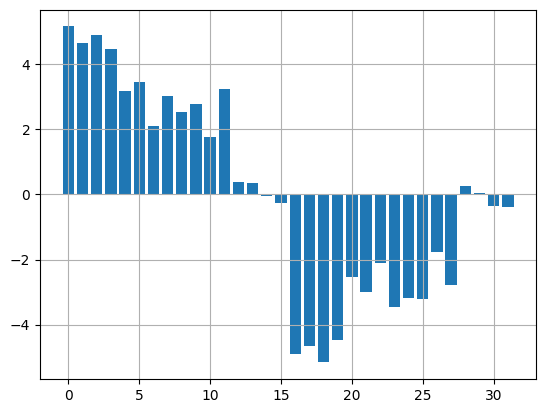

In [4]:
mic_pos = np.load("../data/mic_pos.npy") / 100 # cm to m

stft = STFT(sample_rate=sample_rate, n_fft=512, hop_length=160*1000/sample_rate, win_length=512*1000/sample_rate)
cov = Covariance()
Xs = stft(th.tensor(audio_raw[:, :speech_idx], dtype=th.float32).T.view(1, speech_idx, 32))
XXs = cov(Xs)

music = Music(mics=th.tensor(mic_pos, dtype=th.float32), sample_rate=sample_rate)
doas_music = music(XXs)[0]

taus = doas2taus(doas_music.reshape(1, *doas_music.shape), th.tensor(mic_pos, dtype=th.float32), sample_rate)[0]


print(taus)
print(taus.std(0))

plt.bar(range(taus.shape[1]), taus.mean(0))
plt.grid()
plt.show()


audio_aligned = np.zeros(audio_raw.shape)
lags = np.int64(taus.mean(0))

for i in range(32):
    right_pad = max(0, -lags[i])
    left_pad = max(0, lags[i])
    # if right_pad > 0:
    if right_pad > 0:
        # audio_aligned[i] += np.pad(audio_raw[i], (right_pad, 0))[:-right_pad]
        audio_aligned[i] = np.pad(audio_raw[i], (0, right_pad))[right_pad:]
    elif left_pad > 0:
        # audio_aligned[i] += np.pad(audio_raw[i], (0, left_pad))[left_pad:]
        audio_aligned[i] = np.pad(audio_raw[i], (left_pad, 0))[:-left_pad]
    else:
        audio_aligned[i] = audio_raw[i]


display(Audio(audio_aligned.mean(0), rate=sample_rate))

In [5]:
# Investigate one channel at a time, and then listen to both to identify
left_right = audio_raw[(0, 16), :]
# left_right[0] *= 0.0
# left_right[1] *= 0.0
Audio(left_right, rate=sample_rate)

tensor([-0.9969, -0.0351,  0.0702])


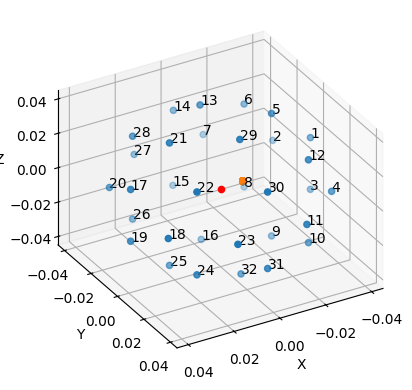

In [6]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d', proj_type='ortho')

ax.scatter(mic_pos[:,0], mic_pos[:,1], mic_pos[:,2])
# ax.set_box_aspect([1, 1, 1])  # Set equal aspect ratio for all axes

# ax.scatter(*doas_srpphat.T / 100)
ax.scatter(*doas_music.T / 100)
ax.scatter(*np.array([[0, 0, 0]]).T, color='red')

# add labels in 3d space
for i in range(1,33):
    ax.text(mic_pos[i-1,0], mic_pos[i-1,1], mic_pos[i-1,2], f"{i}", color='black')

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.view_init(elev=30, azim=60)

# print(doas_srpphat.mean(0))
print(doas_music.mean(0))
plt.show()

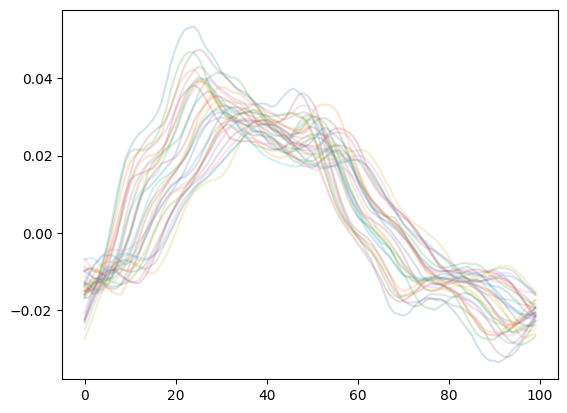

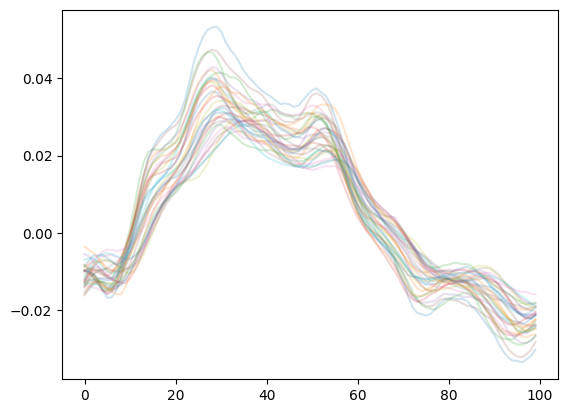

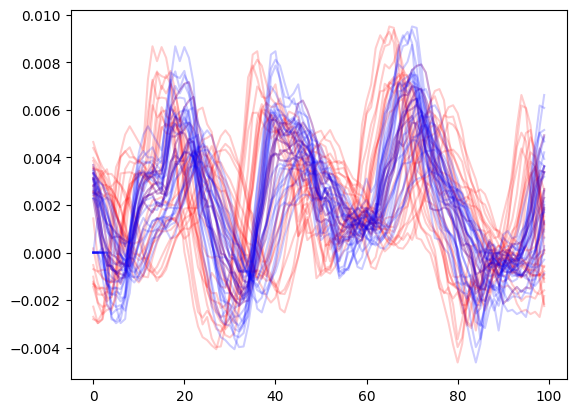

In [7]:
range_start = 100000
range_length = 100

plt.plot(audio_raw[:, range_start:range_start+range_length].T, alpha=0.2)
plt.show()

plt.plot(audio_aligned[:, range_start:range_start+range_length].T, alpha=0.2)
plt.show()

plt.plot(audio_raw[:, :100].T, color="red", alpha=0.2)
plt.plot(audio_aligned[:, :100].T, color="blue", alpha=0.2)
plt.show()

In [8]:
window = signal.windows.hann(256)
stft = signal.ShortTimeFFT(window, 160, sample_rate)

audio_stft = stft.stft(audio_aligned[(0, 1, 2, 3), :], axis=1)
sources_stft = torchiva.AuxIVA_IP(n_iter=100, n_src=4, model=torchiva.models.LaplaceModel()).forward(th.tensor(audio_stft).cuda(), verbose=True)


sources = stft.istft(sources_stft.cpu().numpy())

tensor(410354.2111, device='cuda:0', dtype=torch.float64)
tensor(1659657.8984, device='cuda:0', dtype=torch.float64)
tensor(-13991489.9303, device='cuda:0', dtype=torch.float64)
tensor(-6225044.7453, device='cuda:0', dtype=torch.float64)
tensor(-10112509.9699, device='cuda:0', dtype=torch.float64)
tensor(-8170511.6945, device='cuda:0', dtype=torch.float64)
tensor(-9142737.3779, device='cuda:0', dtype=torch.float64)
tensor(-8657721.6496, device='cuda:0', dtype=torch.float64)
tensor(-8901378.5650, device='cuda:0', dtype=torch.float64)
tensor(-8780816.7972, device='cuda:0', dtype=torch.float64)
tensor(-8842536.6600, device='cuda:0', dtype=torch.float64)
tensor(-8813332.7049, device='cuda:0', dtype=torch.float64)
tensor(-8829828.7533, device='cuda:0', dtype=torch.float64)
tensor(-8823696.7184, device='cuda:0', dtype=torch.float64)
tensor(-8829049.1712, device='cuda:0', dtype=torch.float64)
tensor(-8828761.5899, device='cuda:0', dtype=torch.float64)
tensor(-8831335.6329, device='cuda:0', dt

[3.09110354e+01 1.05970038e+01 6.84559712e+03 6.25707647e+00]


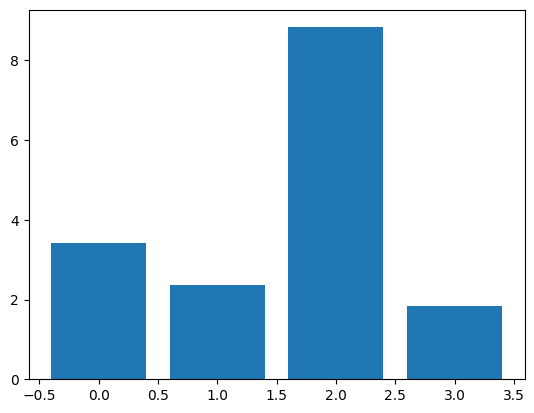

In [9]:
importance = np.abs(audio_aligned[:, :speech_idx] @ sources[:, :speech_idx].T).sum(0)
source_speech = np.argmax(importance)

print(importance)
plt.bar(range(len(importance)), np.log(importance))
plt.show()

In [17]:
model, df_state, _ = init_df("DeepFilterNet3")
enhanced_audio = enhance(model, df_state, th.tensor(sources[source_speech:source_speech+1]*3, dtype=th.float32), atten_lim_db=8)

display(Audio(sources[source_speech], rate=sample_rate))
display(Audio(enhanced_audio, rate=sample_rate))

2024-04-20 22:48:52 | INFO     | DF | Loading model settings of DeepFilterNet3
2024-04-20 22:48:52 | INFO     | DF | Using DeepFilterNet3 model at /home/non-root/.cache/DeepFilterNet/DeepFilterNet3
2024-04-20 22:48:52 | INFO     | DF | Initializing model `deepfilternet3`
2024-04-20 22:48:52 | INFO     | DF | Found checkpoint /home/non-root/.cache/DeepFilterNet/DeepFilterNet3/checkpoints/model_120.ckpt.best with epoch 120
2024-04-20 22:48:52 | INFO     | DF | Running on device cuda:0
2024-04-20 22:48:52 | INFO     | DF | Model loaded


In [18]:
model = DPTNet.from_pretrained('JorisCos/DPTNet_Libri1Mix_enhsingle_16k')

model.eval()
model = model.cuda()
with th.no_grad():
    enhanced_audio2 = model.forward(th.tensor(resample(enhanced_audio, int(enhanced_audio.shape[1]/sample_rate * 16000), axis=1), dtype=th.float32).cuda())[0, 0].cpu()


display(Audio(enhanced_audio2, rate=16000))